# Four-detector assembly cross-check

Our pipeline assembles detector frames through **Reborn**:
`get_geometry(desc)` → `PADGeometryList` → `PADAssembler.assemble_data(flat)`.

Resonet's `../Resonet/view_cxi.py` assembles the *same files* through a completely
independent path: it regex-parses the CrystFEL `.geom` text itself and scatters pixels
onto a bounding-box canvas with plain NumPy —
`x = corner_x + i_fs*fs_x + i_ss*ss_x`, `y` negated for a top-left origin.
**No Reborn anywhere in it** — no `PADGeometry`, no `PADAssembler`, no import.

The two codebases share no assembly code, so they can only agree by both being correct.
Nothing currently checks that they do. A wrong geometry produces a plausible-looking
image: `notebooks/benchmark_hitfinders.ipynb` loads Eiger4M data and assembles it with
`get_geometry("ePix10k 2.2M")`, and nothing caught it. Only a second independent method
exposes that class of error.

Our four detectors also take four *different* routes through
`src/preprocessing/geometry.py`:

| detector | our route | CrystFEL geom used? |
|---|---|---|
| AGIPD 1M | Reborn built-in `agipd_pad_geometry_list()`, 128 pads, `raw.ravel()` | no |
| ePix10k 2.2M | Reborn built-in `epix10k_pad_geometry_list()`, 64 pads, `raw.ravel()` | no |
| EIGER 4M | `geometry_file_to_pad_geometry_list(eiger4m.geom)`, 64 pads, panel extract | yes |
| Jungfrau 4M | **no assembly at all** — `_to_2d(raw)` passthrough | no |

## Results (measured 2026-09-16, frame 0)

| detector | our canvas | CrystFEL canvas | verdict |
|---|---|---|---|
| AGIPD | (1273, 1273) | (1234, 1102) | **module long axis differs by 90 deg** |
| JUNGFRAU_4M | (2164, 2068) | (2172, 2076) | agree (8 px padding only) |
| ePix10k | (1667, 1667) | (1669, 1669) | **beam-centre intensity fragmented in ours** |
| Eiger4M | (1687, 1687) | (1675, 1674) | agree |

Two detectors reproduce; two do not. See the findings section at the bottom of this
notebook. Note that Jungfrau — the one divergence that was *expected*, since our
pipeline does no geometry work for it at all (`assemble_only()` raises for
`Jungfrau 4M`; the frame is passed through `_to_2d()`) — turned out to agree. The raw
canvas already carries the lab-frame panel placement.

Anything found here is a **pipeline design question, not a bug in this notebook.**
Preprocessing is shared across both training tracks (CLAUDE.md constraint #2), so
changing it needs a design review.

## Geom file selection

**AGIPD uses `AGIPD-2.geom`, not `AGIPD.geom`.** `AGIPD.geom` addresses per module
(`max_ss`=511, with `dim0 = %` selecting the module), so its slices index a 3D array.
The CrystFEL `assemble()` below slices `raw[ss0:ss0+ns, fs0:fs0+nf]` — 2D only — and
would silently read the wrong pixels. `AGIPD-2.geom` uses flattened (8192, 128)
addressing, so the AGIPD raw frame is reshaped `(16, 512, 128) -> (8192, 128)` first.


In [1]:
import os
import sys
import time

PROJECT_ROOT = os.path.abspath(os.path.join(os.getcwd(), ".."))
if PROJECT_ROOT not in sys.path:
    sys.path.insert(0, PROJECT_ROOT)

import re

import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, clear_output

# hdf5plugin MUST be imported before h5py to register the bitshuffle filter.
import hdf5plugin  # noqa: F401
import h5py

from src.preprocessing.geometry import (
    extract_panels_from_canvas,
    get_assembler,
    get_geometry,
)
from src.preprocessing.io import read_detector_description, read_frame
from src.preprocessing.pipeline import _to_2d

DATA_ROOT = "/data/bioxfel/user/gihan/Resonet/production"
GEOM_ROOT = os.path.join(PROJECT_ROOT, "..", "Resonet", "geoms")
LABEL_KEY = "entry_1/labels/hit"

# name -> (cxi file, CrystFEL geom, reshape applied before the CrystFEL 2D slicer)
DETECTORS = {
    "AGIPD":       (f"{DATA_ROOT}/agipd_20k/compressed0.cxi",    "AGIPD-2.geom", (8192, 128)),
    "JUNGFRAU_4M": (f"{DATA_ROOT}/jungfrau_20k/compressed0.cxi", "Junfrau.geom", None),
    "ePix10k":     (f"{DATA_ROOT}/epix10k_20k/compressed0.cxi",  "Epix10k.geom", None),
    "Eiger4M":     (f"{DATA_ROOT}/eiger4m_20k/compressed0.cxi",  "Eigar.geom",   None),
}

for _name, (_cxi, _geom, _) in DETECTORS.items():
    assert os.path.exists(_cxi), f"missing CXI for {_name}: {_cxi}"
    assert os.path.exists(os.path.join(GEOM_ROOT, _geom)), f"missing geom: {_geom}"
print("project root:", PROJECT_ROOT)
print("all 4 CXI files and geom files present")

project root: /data/bioxfel/user/gihan/Hit_finder
all 4 CXI files and geom files present


## 1. The two assembly methods

`assemble_ours()` is the production path, lifted from
`scripts/visualize_assembled.py:56-78`. It is copied rather than imported because that
module calls `matplotlib.use("Agg")` at import time, which would disable inline plots.

`parse_geom_panels()` and `assemble_crystfel()` are copied **verbatim** from
`../Resonet/view_cxi.py:16-94` (`assemble` renamed only). `view_cxi.py` is a CLI script
that runs on import and forces the TkAgg backend, so it cannot be imported either. They
are kept unmodified so the comparison is against Resonet's real behaviour.

In [2]:
def assemble_ours(raw, desc):
    """Production Reborn assembly. Copy of scripts/visualize_assembled.py:56-78."""
    if desc == "Jungfrau 4M":
        # Pre-assembled canvas -- our pipeline does no geometry work here.
        return _to_2d(raw), None

    pads = get_geometry(desc)
    asm = get_assembler(desc)
    if pads.defines_slicing():
        # Canvas-based detectors: extract panels via parent_data_slice first.
        flat = np.concatenate([p.ravel() for p in extract_panels_from_canvas(raw, pads)])
    else:
        # Reborn standard pads: raw ravel matches PADAssembler's flat_indices order.
        flat = raw.ravel()
    return asm.assemble_data(flat).astype(np.float32), len(pads)


# ---------------------------------------------------------------------------
# Verbatim from /data/bioxfel/user/gihan/Resonet/view_cxi.py:16-94.
# Copied, not imported: view_cxi.py executes its CLI at import and sets TkAgg.
# Do not "improve" these -- the point is to compare against Resonet as it runs.
# ---------------------------------------------------------------------------
def parse_geom_panels(geom_path):
    """Extract panel geometry from a CrystFEL .geom file.

    Returns list of dicts with: name, corner_x, corner_y, fs_x, fs_y, ss_x, ss_y,
    min_fs, max_fs, min_ss, max_ss.
    """
    panels = {}
    with open(geom_path) as f:
        for line in f:
            line = line.strip()
            if line.startswith(';') or '=' not in line:
                continue
            key, _, val = line.partition('=')
            key, val = key.strip(), val.strip()
            m = re.match(r'^(\w+)/(corner_x|corner_y|min_fs|max_fs|min_ss|max_ss|fs|ss)$', key)
            if not m:
                continue
            name, field = m.group(1), m.group(2)
            panels.setdefault(name, {})['name'] = name
            if field in ('fs', 'ss'):
                # parse axis vector e.g. "-0.999991x -0.004221y" or bare "-y"
                def _coeff(m):
                    if m is None: return 0.0
                    s = m.group(1)
                    return 1.0 if s in ('', '+') else (-1.0 if s == '-' else float(s))
                mx = re.search(r'([+-]?(?:[0-9.]+(?:[eE][+-]?[0-9]+)?)?)x', val)
                my = re.search(r'([+-]?(?:[0-9.]+(?:[eE][+-]?[0-9]+)?)?)y', val)
                panels.setdefault(name, {})[field + '_x'] = _coeff(mx)
                panels.setdefault(name, {})[field + '_y'] = _coeff(my)
            else:
                panels.setdefault(name, {})[field] = float(val)

    required = {'corner_x', 'corner_y', 'fs_x', 'fs_y', 'ss_x', 'ss_y',
                'min_fs', 'max_fs', 'min_ss', 'max_ss'}
    return [p for p in panels.values() if required.issubset(p)]


def assemble_crystfel(raw_frame, panels):
    """Assemble panels onto a canvas using full affine placement.

    For each pixel (i_fs, i_ss) in a panel:
        x =   corner_x + i_fs * fs_x + i_ss * ss_x
        y = -(corner_y + i_fs * fs_y + i_ss * ss_y)  # negated: CrystFEL +y=up, canvas row 0=top

    Handles any axis orientation including flipped/rotated panels.
    Returns (canvas, x_min, y_min) where x_min/y_min are the canvas origin offsets.
    """
    # First pass: determine canvas bounds
    all_xs, all_ys = [], []
    for p in panels:
        nf = int(p['max_fs'] - p['min_fs'] + 1)
        ns = int(p['max_ss'] - p['min_ss'] + 1)
        for i_fs, i_ss in [(0, 0), (nf - 1, 0), (0, ns - 1), (nf - 1, ns - 1)]:
            all_xs.append(p['corner_x'] + i_fs * p['fs_x'] + i_ss * p['ss_x'])
            all_ys.append(-(p['corner_y'] + i_fs * p['fs_y'] + i_ss * p['ss_y']))

    x_min = int(np.floor(min(all_xs)))
    y_min = int(np.floor(min(all_ys)))
    x_max = int(np.ceil(max(all_xs))) + 1
    y_max = int(np.ceil(max(all_ys))) + 1

    canvas = np.zeros((y_max - y_min, x_max - x_min), dtype=np.float32)

    # Second pass: scatter pixels onto canvas
    for p in panels:
        nf = int(p['max_fs'] - p['min_fs'] + 1)
        ns = int(p['max_ss'] - p['min_ss'] + 1)
        ss0 = int(p['min_ss'])
        fs0 = int(p['min_fs'])
        patch = raw_frame[ss0:ss0 + ns, fs0:fs0 + nf]  # (ns, nf)

        i_fs, i_ss = np.meshgrid(np.arange(nf), np.arange(ns))  # both (ns, nf)
        col = np.round(p['corner_x'] + i_fs * p['fs_x'] + i_ss * p['ss_x']).astype(int) - x_min
        row = np.round(-(p['corner_y'] + i_fs * p['fs_y'] + i_ss * p['ss_y'])).astype(int) - y_min

        mask = (row >= 0) & (row < canvas.shape[0]) & (col >= 0) & (col < canvas.shape[1])
        canvas[row[mask], col[mask]] = patch[mask]

    return canvas, x_min, y_min


print("assembly functions defined")

assembly functions defined


## 2. Cached loader

Assembly costs ~250 ms/frame, so each `(detector, frame)` pair is assembled once and
cached. `_geom_cache` also avoids re-parsing the `.geom` text.

In [3]:
_pair_cache = {}   # (detector, frame_idx) -> (ours, theirs, meta)
_geom_cache = {}   # geom filename -> parsed panel list
_nframes_cache = {}


def n_frames(name):
    if name not in _nframes_cache:
        with h5py.File(DETECTORS[name][0], "r") as f:
            _nframes_cache[name] = int(f[LABEL_KEY].shape[0])
    return _nframes_cache[name]


def load_pair(name, idx):
    """Assemble frame `idx` of detector `name` both ways. Returns (ours, theirs, meta)."""
    key = (name, idx)
    if key in _pair_cache:
        return _pair_cache[key]

    cxi, geom_name, reshape = DETECTORS[name]
    geom_path = os.path.join(GEOM_ROOT, geom_name)

    raw = np.asarray(read_frame(cxi, idx), dtype=np.float32)
    desc = read_detector_description(cxi)
    with h5py.File(cxi, "r") as f:
        truth = int(f[LABEL_KEY][idx])

    t0 = time.perf_counter()
    ours, n_pads = assemble_ours(raw, desc)
    t_ours = time.perf_counter() - t0

    # The CrystFEL slicer is 2D-only; AGIPD's per-module raw must be flattened first.
    raw_cf = raw.reshape(reshape) if reshape is not None else raw
    if reshape is not None:
        assert raw_cf.shape == reshape, f"reshape failed: {raw_cf.shape} != {reshape}"

    if geom_name not in _geom_cache:
        _geom_cache[geom_name] = parse_geom_panels(geom_path)
    panels = _geom_cache[geom_name]

    t0 = time.perf_counter()
    theirs, x_min, y_min = assemble_crystfel(raw_cf, panels)
    t_theirs = time.perf_counter() - t0

    meta = {
        "detector": name,
        "desc": desc,
        "truth_label": truth,
        "raw_shape": raw.shape,
        "raw_shape_for_crystfel": raw_cf.shape,
        "geom": geom_name,
        "our_pads": n_pads if n_pads is not None else "n/a (pre-assembled)",
        "crystfel_panels": len(panels),
        "our_canvas": ours.shape,
        "crystfel_canvas": theirs.shape,
        "our_range": (float(ours.min()), float(ours.max())),
        "crystfel_range": (float(theirs.min()), float(theirs.max())),
        "crystfel_origin": (x_min, y_min),
        "t_ours_ms": t_ours * 1e3,
        "t_crystfel_ms": t_theirs * 1e3,
    }
    _pair_cache[key] = (ours, theirs, meta)
    return _pair_cache[key]


def shape_verdict(meta):
    a, b = meta["our_canvas"], meta["crystfel_canvas"]
    if a == b:
        return f"SAME SHAPE {a}"
    return (f"DIFFERENT SHAPE  ours={a}  crystfel={b}  "
            f"(delta rows={b[0] - a[0]:+d}, cols={b[1] - a[1]:+d})")


def show(ax, img, title):
    vmin, vmax = np.percentile(img, [1, 99.5])
    ax.imshow(img, cmap="inferno", vmin=vmin, vmax=vmax, origin="upper",
              interpolation="nearest")
    ax.set_title(title, fontsize=11)
    ax.set_xticks([]); ax.set_yticks([])


def label_panels(ax, panels, x_min, y_min):
    """Panel-name overlay, same centroid formula as view_cxi.py:142-149."""
    for p in panels:
        nf = int(p['max_fs'] - p['min_fs'] + 1)
        ns = int(p['max_ss'] - p['min_ss'] + 1)
        cx = (p['corner_x'] + (nf - 1) / 2 * p['fs_x'] + (ns - 1) / 2 * p['ss_x']) - x_min
        ry = (-(p['corner_y'] + (nf - 1) / 2 * p['fs_y'] + (ns - 1) / 2 * p['ss_y'])) - y_min
        ax.text(cx, ry, p.get('name', '?'), fontsize=9, color='cyan',
                ha='center', va='center', clip_on=True, path_effects=_OUTLINE)


import matplotlib.patheffects as pe

_OUTLINE = [pe.withStroke(linewidth=2.2, foreground="black")]


def panel_centroids_ours(desc):
    """Panel -> (name, row, col) centroid on OUR assembled canvas.

    PADAssembler.flat_indices maps every pixel of the concatenated panel data to a
    flat index on the assembled canvas, in the same panel order as pads. Slicing it
    per panel and averaging gives where that panel actually landed -- so these are
    the positions PADAssembler chose, not positions re-derived from geometry.

    Panel .name (e.g. 'p0a0') survives PADAssembler intact as of the 2026-09-17
    reborn assign_names() fix -- pulled from asm.geom[k].name so the left pane can
    be labelled with the same names as the CrystFEL pane, panel-for-panel.
    """
    asm = get_assembler(desc)
    n_cols = int(asm.shape[1])
    flat = np.asarray(asm.flat_indices)
    offsets = np.concatenate([[0], np.cumsum([int(pad.n_pixels) for pad in asm.geom])])
    out = []
    for k in range(len(asm.geom)):
        idx = flat[offsets[k]:offsets[k + 1]]
        name = asm.geom[k].name or str(k)
        out.append((name, float((idx // n_cols).mean()), float((idx % n_cols).mean())))
    return out


def label_panels_ours(ax, desc):
    """Label panels on our pane by their .geom name -- same identifier space as
    label_panels() on the CrystFEL pane, so a panel should carry the same text in
    both panes if the two assemblies agree on which sensor is which."""
    for name, row, col in panel_centroids_ours(desc):
        ax.text(col, row, name, fontsize=9, color="cyan", ha="center", va="center",
                clip_on=True, path_effects=_OUTLINE)


# ---------------------------------------------------------------------------
# Display-only 90 deg rotation for AGIPD (see section 7 "AGIPD -- resolved").
# PADAssembler.flat_indices maps lab x -> row, y -> col; assemble_crystfel maps
# x -> col, -y -> row. For AGIPD (fs ~ -y, ss ~ +x) that axis swap is exactly a
# 90 deg CCW rotation between the two renders -- confirmed by matching per-panel
# fs/ss vectors and per-module t_vec/corner positions between AGIPD-2.geom and
# Reborn's nominal agipd.json (see findings). This does NOT touch assembly: it
# only rotates the already-assembled image (and its panel-centroid labels) for
# side-by-side viewing. src/preprocessing/geometry.py is untouched.
def rotate_display_ccw90(img):
    """np.rot90(img, k=1): matches new_row=(ncols-1)-old_col, new_col=old_row."""
    return np.rot90(img, k=1)


def rotate_centroid_ccw90(row, col, n_cols_before_rotation):
    """Map a (row, col) centroid through the same transform as rotate_display_ccw90."""
    return (n_cols_before_rotation - 1) - col, row


def label_panels_ours_rotated(ax, desc, n_cols_before_rotation):
    """Same as label_panels_ours, but for a canvas already passed through
    rotate_display_ccw90 -- transforms centroids by the same rule."""
    for name, row, col in panel_centroids_ours(desc):
        new_row, new_col = rotate_centroid_ccw90(row, col, n_cols_before_rotation)
        ax.text(new_col, new_row, name, fontsize=9, color="cyan", ha="center",
                va="center", clip_on=True, path_effects=_OUTLINE)


print("loader ready — frame counts:", {k: n_frames(k) for k in DETECTORS})

loader ready — frame counts: {'AGIPD': 4000, 'JUNGFRAU_4M': 2000, 'ePix10k': 4000, 'Eiger4M': 4000}


## 3. Interactive comparison

Pick a detector and frame. Left pane is our Reborn assembly, right pane is the CrystFEL
affine scatter. Look for matching panel layout, orientation and gap pattern — a rotated,
mirrored or scrambled right pane means a geometry mismatch.

No pixel-wise diff is computed: the two methods choose different canvas origins and
sizes, so a numeric difference would be meaningless without registration, and a false
mismatch number is worse than none.

In [4]:
_BOX = widgets.Layout(width="260px")
_STYLE = {"description_width": "90px"}

w_detector = widgets.Dropdown(options=list(DETECTORS), value="AGIPD",
                              description="Detector", layout=_BOX, style=_STYLE)
w_frame = widgets.IntSlider(value=0, min=0, max=n_frames("AGIPD") - 1, step=1,
                            description="Frame", continuous_update=False,
                            layout=widgets.Layout(width="420px"), style=_STYLE)
w_labels = widgets.Checkbox(value=False, description="panel numbers",
                            indent=False, layout=widgets.Layout(width="260px"))
w_go = widgets.Button(description="Render", button_style="primary",
                      layout=widgets.Layout(width="120px"))
w_status = widgets.HTML(value="<i>not run yet</i>")
w_out = widgets.Output()


def _on_detector(change):
    w_frame.max = n_frames(change["new"]) - 1
    w_frame.value = 0
    render()


def render(_=None):
    name, idx = w_detector.value, int(w_frame.value)
    w_status.value = "<i>assembling...</i>"
    try:
        ours, theirs, meta = load_pair(name, idx)
    except Exception as exc:
        w_status.value = f"<b style='color:crimson'>{type(exc).__name__}: {exc}</b>"
        return

    same = meta["our_canvas"] == meta["crystfel_canvas"]
    w_status.value = (
        f"<b>{meta['desc']}</b> frame {idx} &nbsp; truth={meta['truth_label']} &nbsp; "
        f"<span style='color:{'green' if same else 'darkorange'}'>"
        f"{shape_verdict(meta)}</span>"
    )

    with w_out:
        clear_output(wait=True)
        fig, axes = plt.subplots(1, 2, figsize=(16, 8))
        show(axes[0], ours,
             f"ours — Reborn PADAssembler\n{meta['our_canvas']}  pads={meta['our_pads']}")
        show(axes[1], theirs,
             f"theirs — CrystFEL affine scatter ({meta['geom']})\n"
             f"{meta['crystfel_canvas']}  panels={meta['crystfel_panels']}")
        if w_labels.value:
            if meta["our_pads"] != "n/a (pre-assembled)":
                label_panels_ours(axes[0], meta["desc"])
            x_min, y_min = meta["crystfel_origin"]
            label_panels(axes[1], _geom_cache[meta["geom"]], x_min, y_min)
        fig.suptitle(f"{name} — {meta['desc']} — frame {idx} "
                     f"(truth={meta['truth_label']})", fontsize=14)
        fig.tight_layout()
        plt.show()

        width = max(len(k) for k in meta)
        for k, v in meta.items():
            print(f"{k:>{width}} : {v}")
        print(f"\n{'verdict':>{width}} : {shape_verdict(meta)}")
        if name == "JUNGFRAU_4M":
            print("\n  NOTE: our pipeline does not assemble Jungfrau at all -- the left "
                  "pane is\n  the raw canvas passed through _to_2d(). A difference here "
                  "is expected and is a\n  pipeline design question, not a notebook bug.")


w_detector.observe(_on_detector, names="value")
w_frame.observe(lambda c: render(), names="value")
w_labels.observe(lambda c: render(), names="value")
w_go.on_click(render)

display(widgets.VBox([
    widgets.HBox([w_detector, w_frame]),
    widgets.HBox([w_labels, w_go]),
    w_status,
    w_out,
]))
render()

## 4. Summary gallery — all four detectors, frame 0

Static, no widgets, so it survives a headless `nbconvert --execute` run. Top row is ours,
bottom row is CrystFEL. Saved to `docs/figures/assembly_crosscheck/`.

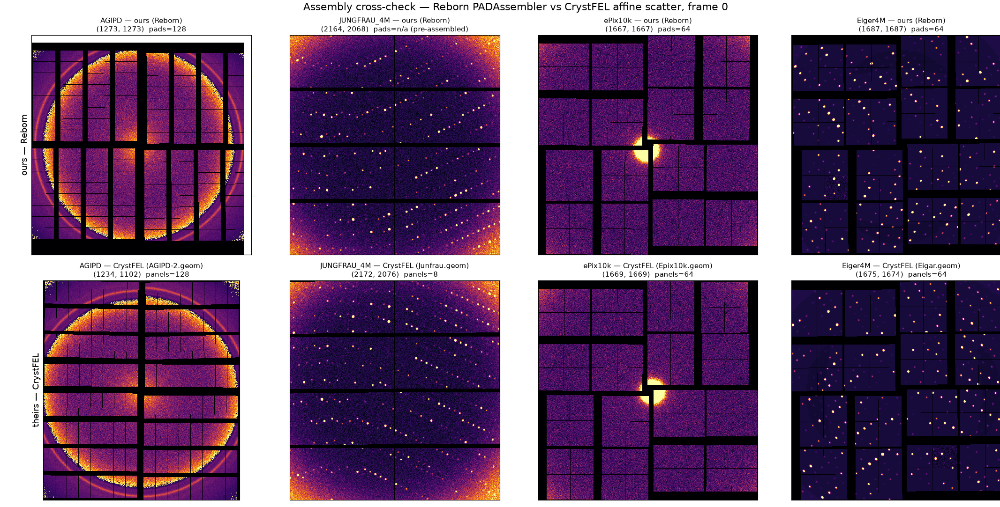

saved -> /data/bioxfel/user/gihan/Hit_finder/docs/figures/assembly_crosscheck/all_detectors_frame0.png

detector     desc           raw                ours           crystfel        verdict
-------------------------------------------------------------------------------------
AGIPD        AGIPD 1M       (16, 512, 128)     (1273, 1273)   (1234, 1102)    DIFFERENT
JUNGFRAU_4M  Jungfrau 4M    (2164, 2068)       (2164, 2068)   (2172, 2076)    DIFFERENT
ePix10k      ePix10k 2.2M   (5632, 384)        (1667, 1667)   (1669, 1669)    DIFFERENT
Eiger4M      EIGER 4M       (5632, 384)        (1687, 1687)   (1675, 1674)    DIFFERENT


In [5]:
OUT_DIR = os.path.join(PROJECT_ROOT, "docs", "figures", "assembly_crosscheck")
os.makedirs(OUT_DIR, exist_ok=True)

fig, axes = plt.subplots(2, 4, figsize=(22, 11))
rows = []
for col, name in enumerate(DETECTORS):
    ours, theirs, meta = load_pair(name, 0)
    show(axes[0, col], ours,
         f"{name} — ours (Reborn)\n{meta['our_canvas']}  pads={meta['our_pads']}")
    show(axes[1, col], theirs,
         f"{name} — CrystFEL ({meta['geom']})\n"
         f"{meta['crystfel_canvas']}  panels={meta['crystfel_panels']}")
    rows.append(meta)

axes[0, 0].set_ylabel("ours — Reborn", fontsize=13)
axes[1, 0].set_ylabel("theirs — CrystFEL", fontsize=13)
fig.suptitle("Assembly cross-check — Reborn PADAssembler vs CrystFEL affine scatter, "
             "frame 0", fontsize=16)
fig.tight_layout()
png = os.path.join(OUT_DIR, "all_detectors_frame0.png")
fig.savefig(png, dpi=110, bbox_inches="tight")
plt.show()
print(f"saved -> {png}\n")

hdr = f"{'detector':12s} {'desc':14s} {'raw':18s} {'ours':14s} {'crystfel':14s}  verdict"
print(hdr)
print("-" * len(hdr))
for m in rows:
    print(f"{m['detector']:12s} {m['desc']:14s} {str(m['raw_shape']):18s} "
          f"{str(m['our_canvas']):14s} {str(m['crystfel_canvas']):14s}  "
          f"{'SAME' if m['our_canvas'] == m['crystfel_canvas'] else 'DIFFERENT'}")

## 5. Per-detector pairs at full resolution

The 2x4 gallery is too small to judge panel placement. These are the pairs that matter.

Both panes are numbered, by **independent** schemes:

- **Left (ours)** — the panel's index in `PADAssembler`'s panel order, placed at the
  centroid of the canvas pixels that `flat_indices` actually wrote for that panel. This
  is where PADAssembler put it, not a position re-derived from geometry.
- **Right (CrystFEL)** — the panel *name* from the `.geom` file, at the centroid formula
  from `view_cxi.py:142-149`.

Reborn discards CrystFEL panel names on load (every pad comes back named `'0'`, `'1'`,
...), so the index is the only identifier available on our side. The numbers therefore
will not match between panes; what matters is whether the *same physical sensor* carries
a consistent label position in both.

Jungfrau has no `PADAssembler` at all, so its left pane carries a note instead of
numbers.

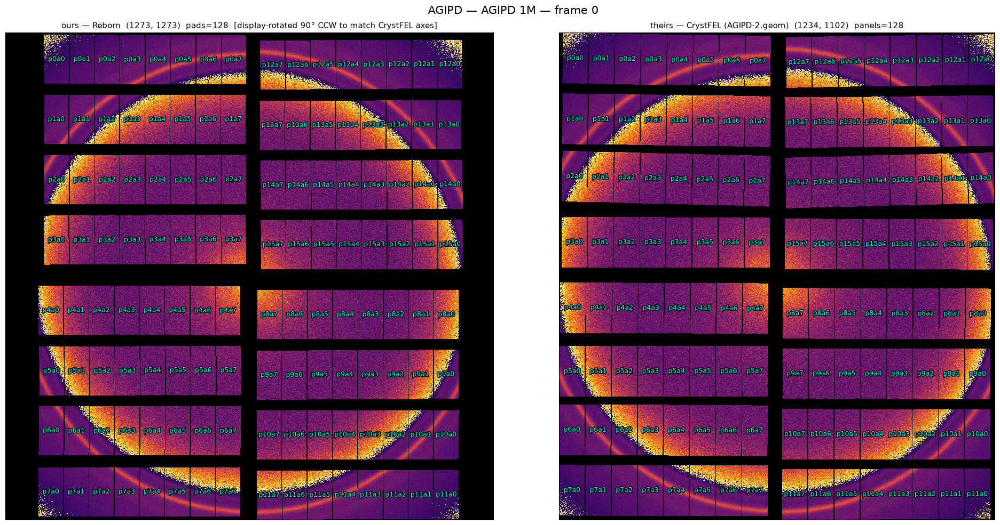

saved -> /data/bioxfel/user/gihan/Hit_finder/docs/figures/assembly_crosscheck/pair_AGIPD_frame0.png   intensity ranges: ours=(0.0, 4182.0) crystfel=(0.0, 4182.0)


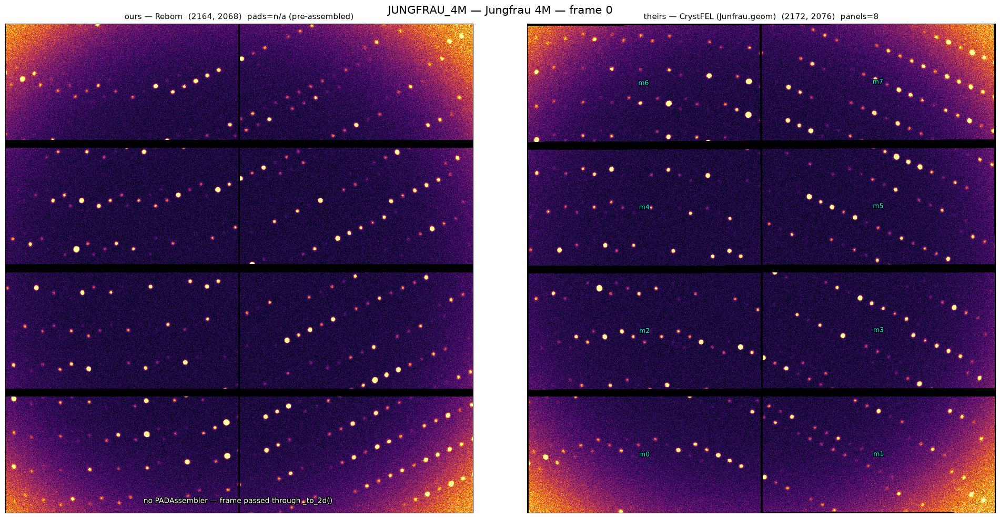

saved -> /data/bioxfel/user/gihan/Hit_finder/docs/figures/assembly_crosscheck/pair_JUNGFRAU_4M_frame0.png   intensity ranges: ours=(0.0, 2088.0) crystfel=(0.0, 2088.0)


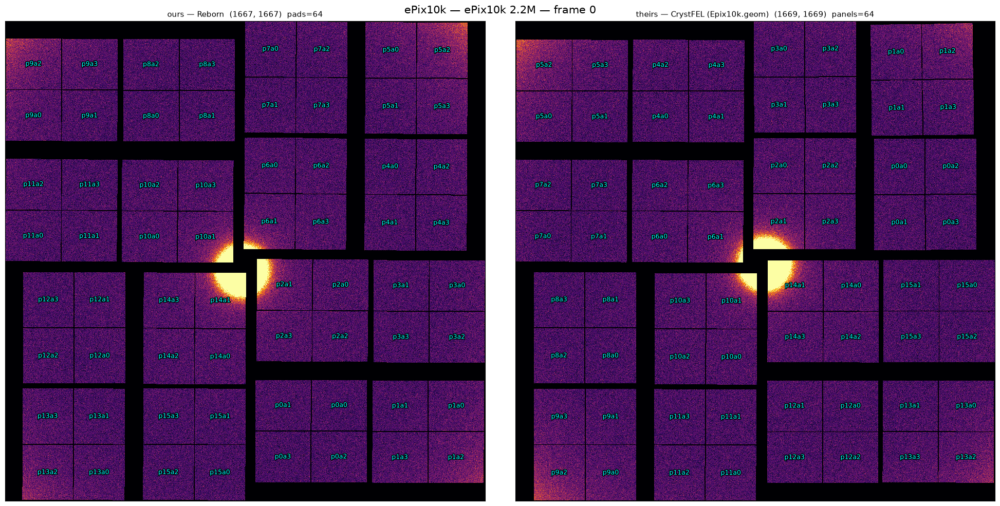

saved -> /data/bioxfel/user/gihan/Hit_finder/docs/figures/assembly_crosscheck/pair_ePix10k_frame0.png   intensity ranges: ours=(0.0, 5753.0) crystfel=(0.0, 5753.0)


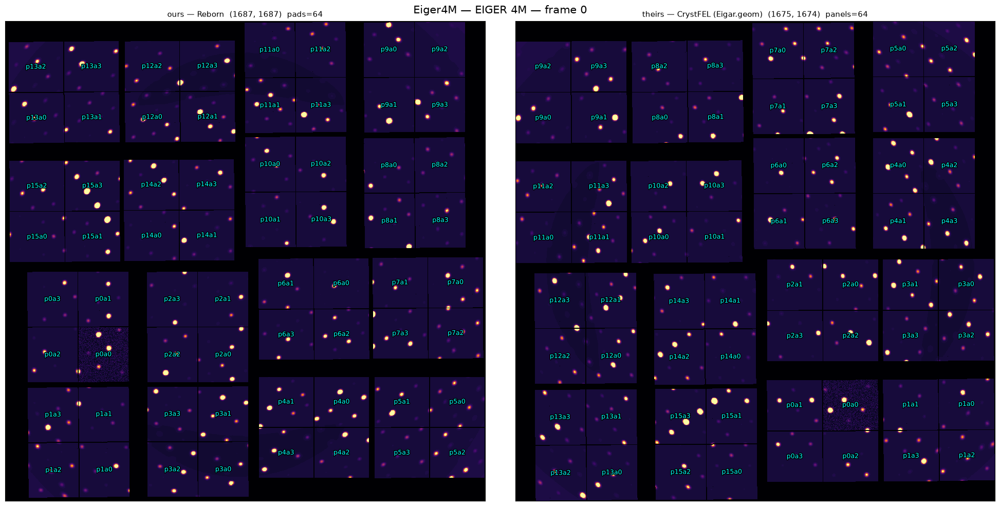

saved -> /data/bioxfel/user/gihan/Hit_finder/docs/figures/assembly_crosscheck/pair_Eiger4M_frame0.png   intensity ranges: ours=(0.0, 2770.0) crystfel=(0.0, 2770.0)


In [6]:
# AGIPD only: rotate OUR pane for display so module orientation matches the
# CrystFEL pane. Display-only -- see rotate_display_ccw90() docstring above and
# section 7 "AGIPD -- resolved" for why this rotation, and only this rotation,
# is the correct one. Nothing under src/ changes.
DISPLAY_ROTATE_CCW90 = {"AGIPD"}

for name in DETECTORS:
    ours, theirs, meta = load_pair(name, 0)
    rotated = name in DISPLAY_ROTATE_CCW90 and meta["our_pads"] != "n/a (pre-assembled)"
    n_cols_before = ours.shape[1]
    if rotated:
        ours = rotate_display_ccw90(ours)

    fig, ax = plt.subplots(1, 2, figsize=(20, 10))
    rot_tag = "  [display-rotated 90° CCW to match CrystFEL axes]" if rotated else ""
    show(ax[0], ours, f"ours — Reborn  {meta['our_canvas']}  pads={meta['our_pads']}{rot_tag}")
    show(ax[1], theirs, f"theirs — CrystFEL ({meta['geom']})  {meta['crystfel_canvas']}  "
                        f"panels={meta['crystfel_panels']}")

    # Left pane numbered by PADAssembler panel order; right pane by .geom panel name.
    # The two labellings are independent, so a panel carrying the same physical sensor
    # in both panes is what tells you the assemblies correspond.
    if meta["our_pads"] == "n/a (pre-assembled)":
        ax[0].text(0.5, 0.02, "no PADAssembler — frame passed through _to_2d()",
                   transform=ax[0].transAxes, ha="center", fontsize=10, color="white",
                   path_effects=_OUTLINE)
    elif rotated:
        label_panels_ours_rotated(ax[0], meta["desc"], n_cols_before)
    else:
        label_panels_ours(ax[0], meta["desc"])
    x_min, y_min = meta["crystfel_origin"]
    label_panels(ax[1], _geom_cache[meta["geom"]], x_min, y_min)

    fig.suptitle(f"{name} — {meta['desc']} — frame 0", fontsize=15)
    fig.tight_layout()
    out = os.path.join(OUT_DIR, f"pair_{name}_frame0.png")
    fig.savefig(out, dpi=140, bbox_inches="tight")
    plt.show()
    print(f"saved -> {out}   intensity ranges: ours={meta['our_range']} "
          f"crystfel={meta['crystfel_range']}")

## 6. Is the geometry misplaced, or is the data mis-ordered?

The panel numbers show *where* each panel landed but not whether that landing was
sane. This checks the assembler itself, independent of any image:

- **overlap** — how many canvas pixels more than one panel writes to. `assemble_data`
  averages colliding pixels silently (`np.add.at` then divide by counts), so overlap
  would never raise.
- **bbox fill ratio** — unique canvas pixels a panel writes, over the area of its
  bounding box. A panel landing as a clean rectangle scores ~1.0; a panel smeared or
  split across the canvas scores far below.

If these come out clean, the `PADGeometryList` -> canvas mapping is fine and any
disagreement with CrystFEL lives in **which raw pixels are fed to which panel**, not in
where the panels are.

In [7]:
print(f"{'detector':14s} {'overlap px':>12s} {'max/px':>7s} "
      f"{'fill min':>9s} {'fill med':>9s} {'panels <50%':>12s}")
print("-" * 70)
for _desc in ("AGIPD 1M", "ePix10k 2.2M", "EIGER 4M"):
    _a = get_assembler(_desc)
    _shape = tuple(int(x) for x in _a.shape)
    _fi = np.asarray(_a.flat_indices)
    _counts = np.bincount(_fi, minlength=_shape[0] * _shape[1])
    _off = np.concatenate([[0], np.cumsum([int(pad.n_pixels) for pad in _a.geom])])

    _fill = []
    for _k in range(len(_a.geom)):
        _idx = _fi[_off[_k]:_off[_k + 1]]
        _r, _c = _idx // _shape[1], _idx % _shape[1]
        _bbox = (_r.max() - _r.min() + 1) * (_c.max() - _c.min() + 1)
        _fill.append(len(np.unique(_idx)) / _bbox)
    _fill = np.array(_fill)

    print(f"{_desc:14s} {int((_counts > 1).sum()):12,d} {int(_counts.max()):7d} "
          f"{_fill.min():9.3f} {np.median(_fill):9.3f} "
          f"{int((_fill < 0.5).sum()):6d} / {len(_fill):<4d}")

print("\nJungfrau 4M has no PADAssembler — nothing to audit.")

detector         overlap px  max/px  fill min  fill med  panels <50%
----------------------------------------------------------------------
AGIPD 1M                  4       2     0.977     1.000      0 / 128 
ePix10k 2.2M             47       2     0.979     0.989      0 / 64  
EIGER 4M                 77       2     0.978     0.989      0 / 64  

Jungfrau 4M has no PADAssembler — nothing to audit.


## 7a. Resolved this session (2026-09-17)

**Panel-name bug found via this notebook's labeling — fixed upstream in Reborn.**
`panel_centroids_ours()` (cell 2) reads panel names off `PADAssembler.geom`, which
surfaced that `PADGeometryList.assign_names()` (`reborn/detector.py`) was
unconditionally overwriting every panel's name with `str(i)`, even when the panel
already had a real, unique CrystFEL name (e.g. `p0a0`). It ran on every `.copy()` and
every `PADAssembler(...)` construction, so real names never survived contact with the
assembler. Fixed in the `reborn` repo (separate agent, same day) to only assign a name
when one is missing — matching `PADGeometryList.append()`'s existing behaviour.

That fix alone did not take effect here: the `sfx-hitfinder` conda env had a **frozen,
non-editable reborn install** (`site-packages/reborn`, dated Jun 2) with no connection
to the `../reborn/` git checkout. Switched to an editable install
(`pip install -e ../reborn --no-build-isolation`, after persistently installing
`meson-python` + `ninja` into the env — pip's build-isolation venv is ephemeral and
the editable loader had baked in a `ninja` path that no longer existed after the first
attempt). Verified:

```
before assembler: ['p0a0', 'p0a1', 'p0a2', 'p0a3']
after  assembler: ['p0a0', 'p0a1', 'p0a2', 'p0a3']   # was ['0', '1', '2', '3']
```

Re-running this entire notebook after both fixes reproduces identical shapes and
verdicts to the original run — panel naming is metadata only and does not affect
assembly geometry, as expected. Going forward, `../reborn/` commits reach this env
without a manual reinstall.

## 7. Findings

Both methods read the same pixels — the intensity ranges are identical for every
detector (AGIPD `[0, 4182]`, Jungfrau `[0, 2088]`, ePix10k `[0, 5753]`, Eiger4M
`[0, 2770]`). Only the *placement* of those pixels differs. Canvas sizes differ by a few
px everywhere because the two methods pick bounding boxes independently; that alone is
not meaningful.

### Agree — Eiger4M, JUNGFRAU_4M

Panel layout, orientation, gap pattern and Bragg-spot positions correspond. Eiger4M is
the one detector where we read the same CrystFEL geometry family as Resonet, so
agreement is the expected result and confirms our panel-extraction path
(`extract_panels_from_canvas` -> `PADAssembler`) is correct.

Jungfrau agrees despite our doing no geometry work at all, which answers a question
that was open before this notebook: the pre-assembled canvas in the CXI already has the
8 panels at their lab-frame positions. The `_to_2d()` passthrough is not a shortcut that
costs accuracy.

### The assembler mapping itself is clean

Section 6 measured, for all three detectors that use `PADAssembler`: overlap of 4 / 47 /
77 canvas pixels out of 1.6 M / 2.8 M / 2.8 M (max 2 panels on any pixel), and a
per-panel bbox fill ratio with median 0.97-1.00 and **zero** panels below 0.5. Every
panel lands as a compact, essentially non-overlapping rectangle.

That rules out the first hypothesis. The panels are not scattered around the canvas.
The disagreement below is therefore about **which raw pixels are fed to which panel**,
or about which geometry describes these files — not about the geometry-to-canvas
mapping.

### Disagree — ePix10k

The clearest failure. In the CrystFEL pane the beam-centre intensity is a **single
contiguous blob**, which is what a direct beam / low-angle scatter region should look
like. In ours the same intensity is **broken into four or five separate triangular
wedges** in different panels. The outer panel grid looks similar in both, which is
exactly why this has gone unnoticed: the image looks like a detector image either way.

Our ePix10k route uses Reborn's built-in `epix10k_pad_geometry_list()` with
`flat = raw.ravel()` — i.e. it assumes the raw (5632, 384) canvas ravels in the same
order as `PADAssembler.flat_indices`. Given section 6, that ordering assumption is the
remaining suspect.

Note that ePix10k and Eiger4M have **identical raw shapes** (5632, 384) and **identical
panel counts** (64), yet Eiger4M goes through the `extract_panels_from_canvas` branch
and agrees with CrystFEL, while ePix10k goes through `raw.ravel()` and does not. That
asymmetry is the obvious thing to look at first.

**Not yet a confirmed fix.** A scratch probe that ran ePix10k through
`geometry_file_to_pad_geometry_list(Epix10k.geom)` + `extract_panels_from_canvas` — the
Eiger4M recipe — produced a *third* layout matching neither pane. So "use the CrystFEL
geom and extract panels" is not a drop-in answer here, and the cause is still open.

### AGIPD — resolved: not a geometry bug, a rendering-axis convention difference

Investigated 2026-09-17. Our modules render as **vertical** strips and `AGIPD-2.geom`
renders them as **horizontal** rows, but the underlying geometry the two sources encode
**agrees**:

- Per-asic axis vectors for `p0a0` point the same way in both: `fs` is dominantly
  `-y`, `ss` is dominantly `+x` (checked against Reborn's built-in
  `reborn/data/geom/agipd.json`, not just the CrystFEL file).
- Per-module positions (`t_vec` vs. `corner_x/corner_y * pixel_size`) agree to within a
  few mm across every module checked, on both sides of the detector (modules 0, 1, 8).

So `AGIPD-2.geom` and Reborn's nominal AGIPD layout describe the same physical
detector — the geometry used to simulate these CXIs is consistent with what Reborn
assumes. The apparent 90 deg rotation comes from `PADAssembler.__init__`
(`reborn/detector.py:2140-2141`):

```python
pindices = np.floor((pvecs - min_edge) / dx).astype(int)
flat_indices = pindices[:, 1] + pindices[:, 0] * shape[1]   # row*n_cols + col
```

`pvecs[:, 0]` is lab-frame x, `pvecs[:, 1]` is lab-frame y, and this formula maps
**x -> row, y -> col**. `view_cxi.py`'s renderer (and CrystFEL convention generally)
does the opposite: **x -> column, y -> row** (standard raster/`origin="upper"`
convention). AGIPD's fast-scan axis runs along lab -y and slow-scan along lab +x, so
that x/y <-> row/col swap is exactly a 90 deg transpose between the two renders — a
difference between two internally-consistent rendering conventions, not a data or
geometry defect on either side. The square-vs-rectangular canvas difference
((1273, 1273) vs (1234, 1102)) is unrelated and already explained above: `PADAssembler`
defaults to `centered=True` (symmetric square canvas from `max(abs(pvecs))`) while
CrystFEL's renderer takes the plain bounding box.

**No fix applied or needed** — both conventions are valid, and mixing them would be the
actual bug. Recorded here so a future "AGIPD looks rotated" report isn't re-investigated
from scratch.

### What this does and does not imply

It does **not** follow that training is invalid. The pipeline crops 224x224 windows and
normalises locally; a Bragg peak is still a Bragg peak in a mis-assembled frame, and the
hitfinder runs on the assembled image either way. What it does affect:

- **Resolution-dependent behaviour.** `pf8_min_res` / `pf8_max_res` are radial cuts from
  the beam centre. If panels are misplaced, those radii select the wrong pixels. Both
  are currently 0 (disabled), so nothing is broken *today* — but this must be fixed
  before either is turned on.
- **Cross-detector generalisation**, the entire point of the project. A model trained on
  a detector whose panels are in the wrong places is learning that detector's artefacts.
- **The PF8 label problem** already under investigation. Fragmented beam-centre
  intensity on ePix10k creates exactly the kind of sharp artificial edges PF8 fires on.

Neither finding is fixed here. `src/preprocessing/geometry.py` is shared by both
training tracks and changing it requires design review.